# Deep Learning in Particle Physics 

## 1. Defining the Problem

This project is a signal-to-background binary classification of SUSY particles which stands for supersymmetry - a theory proposing a space-time symmetry where each particle in the standard model has a corresponding partner particle. The dataset was found on UCI Machine Learning Repository which is an open
data repository. Inspired by the ‘The Deep Learning on a Public Dataset Template’ and following the methodology of 'Deep Learning with Python' by F. Chollet , I decided to tackle the binary classification problem on the SUSY dataset. 

## 2. Measure of Success

As stated in the preliminary report, The AUC benchmark results presented in dataset's the original paper, 'Searching for Exotic Particles in High-Energy Physics with Deep Learning' by Baldi et al., served as the evaluation metric. AUC refers to the area under the receiver operating characteristic curve, which plots the true positive rate against the false positive rate. Higher AUC values indicate improved classification accuracy.  In their study, the authors employed three primary methods: Bayesian Decision Tree, a 5-layer neural network, and deep networks with a dropout algorithm. They achieved an impressive final AUC of 0.88. I will use both AUC and accuracy as the evaluation metrics since they both provide important insights into the model's performance.

## 3. Evaluation Protocol
Using simple hold-out evaluation in this project should work well since we have a large dataset available to evaluate the model. To do this, I will use the following code: model.evaluate(x_val,y_val) to explicitly evaluate the model on the held-out validation data set as stated in 'Deep Learning with Python'.

## 4. Preparing Data

### 4.1 Dataset

### 4.2 Importing the Dataset

In [1]:
# required libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split

In [2]:
# set the column headers here
susy = pd.read_csv('./Data/susy.csv', names = ['label','lepton 1 pT', 'lepton 1 eta', 'lepton 1 phi', 'lepton 2 pT', 'lepton 2 eta', 'lepton 2 phi', 'missing energy magnitude', 'missing energy phi', 'MET_rel', 'axial MET', 'M_R', 'M_TR_2', 'R', 'MT2', 'S_R', 'M_Delta_R', 'dPhi_r_b', 'cos(theta_r1)'])

### 4.3 Exploring the Data

In [3]:
#exploring the data
susy.describe

<bound method NDFrame.describe of          label  lepton 1 pT  lepton 1 eta  lepton 1 phi  lepton 2 pT   
0          0.0     0.972861      0.653855      1.176225     1.157156  \
1          1.0     1.667973      0.064191     -1.225171     0.506102   
2          1.0     0.444840     -0.134298     -0.709972     0.451719   
3          1.0     0.381256     -0.976145      0.693152     0.448959   
4          1.0     1.309996     -0.690089     -0.676259     1.589283   
...        ...          ...           ...           ...          ...   
4999995    1.0     0.853325     -0.961783     -1.487277     0.678190   
4999996    0.0     0.951581      0.139370      1.436884     0.880440   
4999997    0.0     0.840389      1.419162     -1.218766     1.195631   
4999998    1.0     1.784218     -0.833565     -0.560091     0.953342   
4999999    0.0     0.761500      0.680454     -1.186213     1.043521   

         lepton 2 eta  lepton 2 phi  missing energy magnitude   
0           -1.739873     -0.874309 

In [4]:
# Making sure the headers are correct 
susy.head()

,label,lepton 1 pT,lepton 1 eta,lepton 1 phi,lepton 2 pT,lepton 2 eta,lepton 2 phi,missing energy magnitude,missing energy phi,MET_rel,axial MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos(theta_r1)
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859


In [5]:
# shape of the data
print(susy.shape)

(5000000, 19)


In [6]:
# dataset info
susy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000000 entries, 0 to 4999999
Data columns (total 19 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   label                     float64
 1   lepton 1 pT               float64
 2   lepton 1 eta              float64
 3   lepton 1 phi              float64
 4   lepton 2 pT               float64
 5   lepton 2 eta              float64
 6   lepton 2 phi              float64
 7   missing energy magnitude  float64
 8   missing energy phi        float64
 9   MET_rel                   float64
 10  axial MET                 float64
 11  M_R                       float64
 12  M_TR_2                    float64
 13  R                         float64
 14  MT2                       float64
 15  S_R                       float64
 16  M_Delta_R                 float64
 17  dPhi_r_b                  float64
 18  cos(theta_r1)             float64
dtypes: float64(19)
memory usage: 724.8 MB


In [7]:
# Considering only low-level features
selected_features = ['label','lepton 1 pT', 'lepton 1 eta', 'lepton 1 phi', 'lepton 2 pT', 'lepton 2 eta', 'lepton 2 phi', 'missing energy magnitude', 'missing energy phi']
susy_low_level = susy[selected_features]

### 4.4 Visualizing the Data

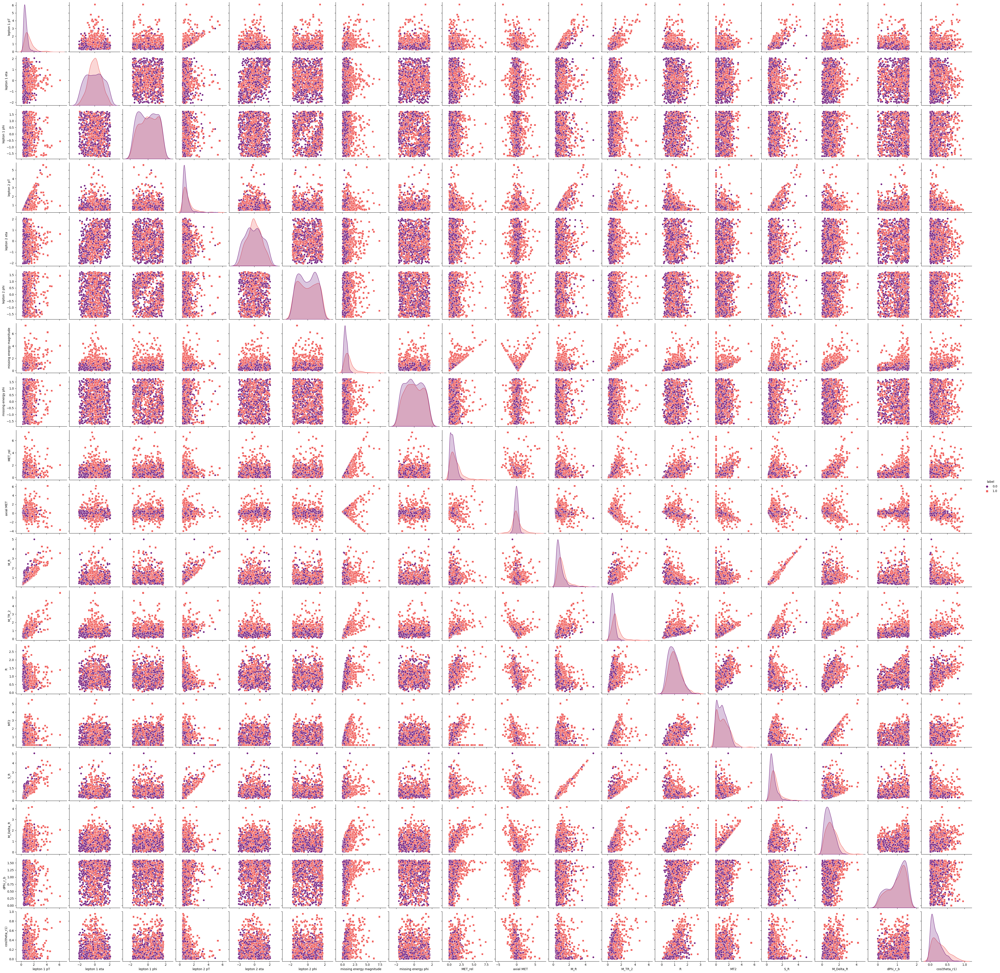

In [8]:
# run the plotting function on a random 1000 sample of the dataset - since the dataset is huge
sns.pairplot(susy.sample(1000), hue = "label",markers=["o", "s"], palette = 'magma')

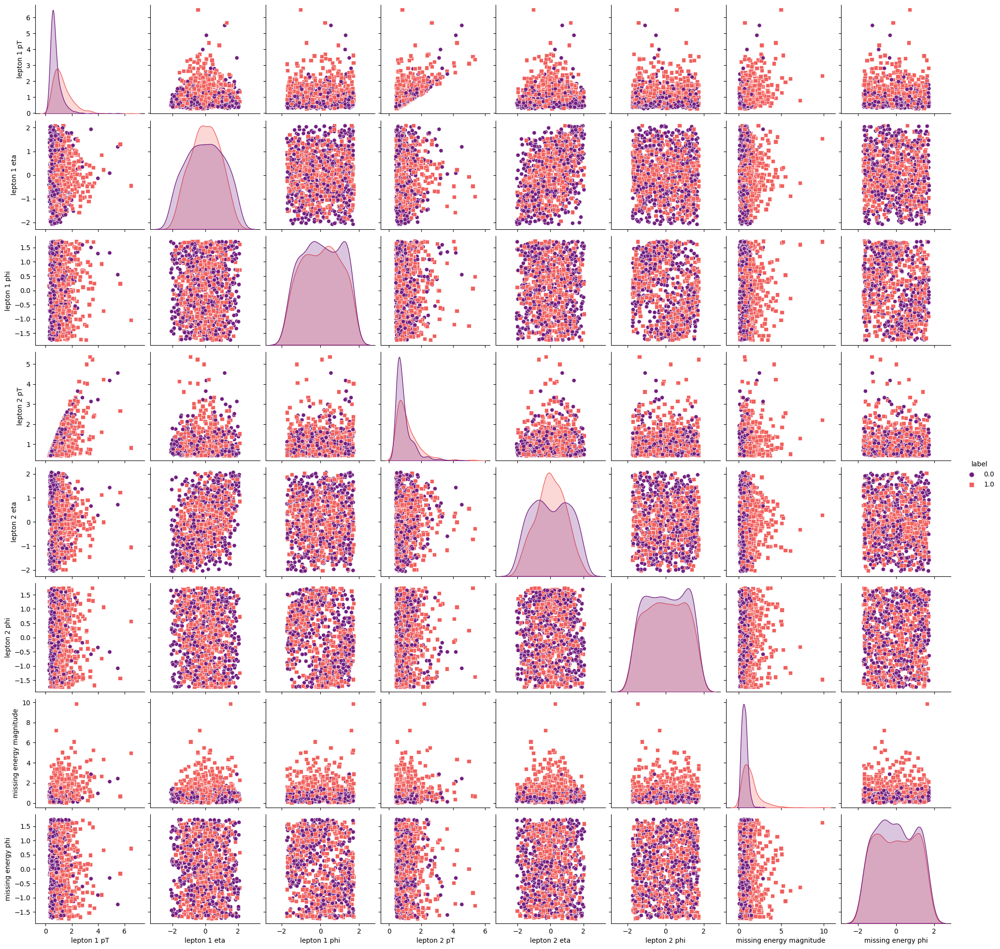

In [9]:
# run the plotting function on a random 1000 sample of the dataset - only looking at the low level features here
sns.pairplot(susy_low_level.sample(1000), hue = "label",markers=["o", "s"], palette = 'magma')

The plot above, suggest 'lepton 1 pT', 'lepton 1 phi' and 'missing energy magnitude' are a good choice for creating a classifier based on since the signal and background in almost all of these feature's plot are almost separated and are not mixed together like 'lepton 2 eta' or 'lepton 1 eta'.

In [10]:
data = susy_low_level

In [11]:
X = data.iloc[:, 1:].values # susy low level features
y = data['label'].values #target value

# Creating testing and training data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [12]:
X_val = X_train[:800000]
partial_X_train = X_train[800000:]
y_val = y_train[:800000]
partial_y_train = y_train[800000:]

## 5. Model Development

In [13]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(layers.Dense(32, activation='relu', input_shape=(8,)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy',tf.keras.metrics.AUC()])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                288       
                                                                 
 dense_1 (Dense)             (None, 32)                1056      
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2,433
Trainable params: 2,433
Non-trainable params: 0
_________________________________________________________________


In [14]:
history = model.fit(partial_X_train, partial_y_train, epochs = 10, batch_size = 512, validation_data= (X_val, y_val))
results = model.evaluate(X_val, y_val)

Epoch 1/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4545 - accuracy: 0.7877 - auc: 0.8587 - val_loss: 0.4389 - val_accuracy: 0.7966 - val_auc: 0.8686
Epoch 2/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4387 - accuracy: 0.7966 - auc: 0.8685 - val_loss: 0.4400 - val_accuracy: 0.7957 - val_auc: 0.8702
Epoch 3/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4357 - accuracy: 0.7982 - auc: 0.8703 - val_loss: 0.4338 - val_accuracy: 0.7994 - val_auc: 0.8716
Epoch 4/10
6250/6250 [==============================] - 8s 1ms/step - loss: 0.4344 - accuracy: 0.7990 - auc: 0.8711 - val_loss: 0.4354 - val_accuracy: 0.7989 - val_auc: 0.8724
Epoch 5/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4335 - accuracy: 0.7995 - auc: 0.8716 - val_loss: 0.4326 - val_accuracy: 0.8002 - val_auc: 0.8727
Epoch 6/10
6250/6250 [==============================] - 6s 1ms/step - loss: 0.4330 - accuracy: 0.7999 - auc: 0.8720 - va

In [15]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'auc', 'val_loss', 'val_accuracy', 'val_auc'])

In [16]:
# Defining plot AUC and loss and accuracy functions against the training and validation dataset
# Inspired by ML lectures/lab - I created my own function to stop repeating the plot function
import matplotlib.pyplot as plt

def plot_auc(auc_values, val_auc_values, epochs):
    plt.plot(epochs, auc_values, 'ro', label='Training AUC')
    plt.plot(epochs, val_auc_values, 'r', label='Validation AUC')
    plt.title('Training and Validation AUC')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.legend()
    plt.show()
    
def plot_loss(loss_values, val_loss_values, epochs):
    plt.plot(epochs, loss_values, 'ro', label='Training loss')
    plt.plot(epochs, val_loss_values, 'r', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    
def plot_acc(acc, val_acc, epochs):
    plt.plot(epochs, acc, 'go', label='Training acc')
    plt.plot(epochs, val_acc, 'g', label='Validation acc')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

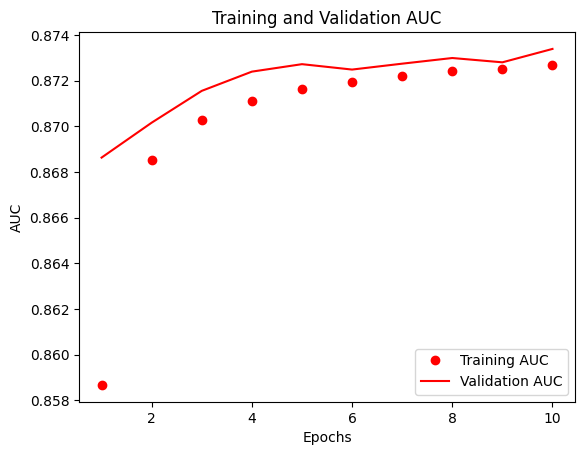

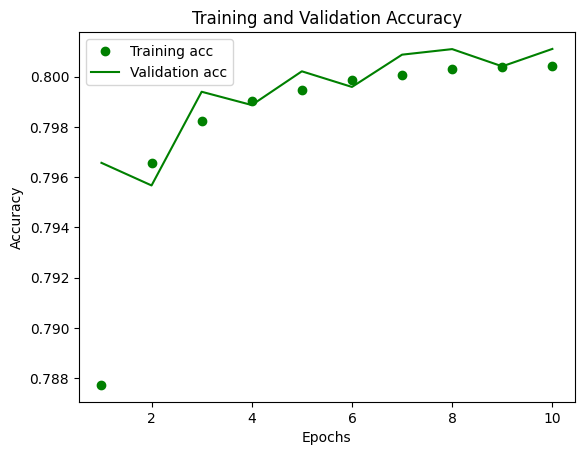

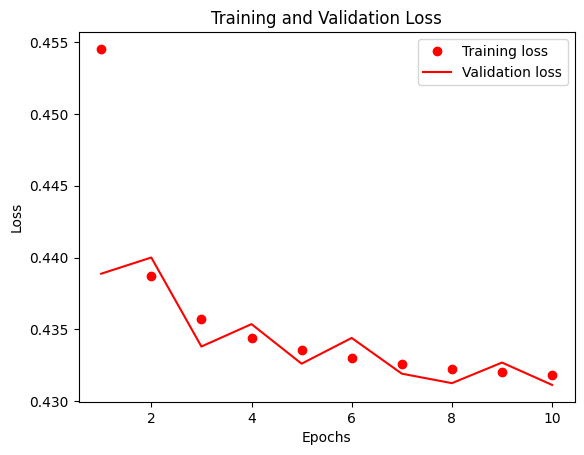

In [19]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc = history_dict['accuracy']
val_acc = history_dict['val_accuracy']
auc = history_dict['auc'] # as different models the compiled the name changes : auc_1, auc_2, etc. 
val_auc = history_dict['val_auc']
epochs = range(1, len(loss_values) + 1)

plot_auc(auc,val_auc,epochs)
plot_acc(acc, val_acc,epochs)
plot_loss(loss_values, val_loss_values,epochs)

### 6. Scaling up: Overfit Model Development

In this section, we overfit the model by tweaking different parameters.

### 6.1 Adding Layers

In [20]:
#adding one additional relu layer
model = models.Sequential()
model.add(layers.Dense(32, activation='relu', input_shape=(8,)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy',tf.keras.metrics.AUC()])

history = model.fit(partial_X_train, partial_y_train, epochs = 10, batch_size = 512, validation_data= (X_val, y_val))
results = model.evaluate(X_val, y_val)


Epoch 1/10
6250/6250 [==============================] - 8s 1ms/step - loss: 0.4542 - accuracy: 0.7878 - auc_1: 0.8589 - val_loss: 0.4415 - val_accuracy: 0.7955 - val_auc_1: 0.8677
Epoch 2/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4394 - accuracy: 0.7960 - auc_1: 0.8681 - val_loss: 0.4375 - val_accuracy: 0.7975 - val_auc_1: 0.8702
Epoch 3/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4358 - accuracy: 0.7983 - auc_1: 0.8703 - val_loss: 0.4335 - val_accuracy: 0.8001 - val_auc_1: 0.8723
Epoch 4/10
6250/6250 [==============================] - 8s 1ms/step - loss: 0.4341 - accuracy: 0.7993 - auc_1: 0.8713 - val_loss: 0.4334 - val_accuracy: 0.8001 - val_auc_1: 0.8723
Epoch 5/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4333 - accuracy: 0.7997 - auc_1: 0.8718 - val_loss: 0.4330 - val_accuracy: 0.8001 - val_auc_1: 0.8721
Epoch 6/10
6250/6250 [==============================] - 7s 1ms/step - loss: 0.4328 - accuracy: 0.800

Adding layers made 0.01% difference in accuracy and 0.02% in AUC. 

### Making the Layers Larger

In [22]:
#Increase the layer capacity to 64
model = models.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(8,)))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy',tf.keras.metrics.AUC()])

history = model.fit(partial_X_train, partial_y_train, epochs = 10, batch_size = 512, validation_data= (X_val, y_val))
results = model.evaluate(X_val,y_val)

Epoch 1/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4484 - accuracy: 0.7913 - auc_3: 0.8625 - val_loss: 0.4357 - val_accuracy: 0.7982 - val_auc_3: 0.8704
Epoch 2/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4349 - accuracy: 0.7988 - auc_3: 0.8708 - val_loss: 0.4325 - val_accuracy: 0.8007 - val_auc_3: 0.8727
Epoch 3/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4327 - accuracy: 0.8001 - auc_3: 0.8722 - val_loss: 0.4309 - val_accuracy: 0.8016 - val_auc_3: 0.8734
Epoch 4/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4317 - accuracy: 0.8005 - auc_3: 0.8727 - val_loss: 0.4301 - val_accuracy: 0.8018 - val_auc_3: 0.8740
Epoch 5/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4311 - accuracy: 0.8009 - auc_3: 0.8731 - val_loss: 0.4305 - val_accuracy: 0.8016 - val_auc_3: 0.8739
Epoch 6/10
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4308 - accuracy:

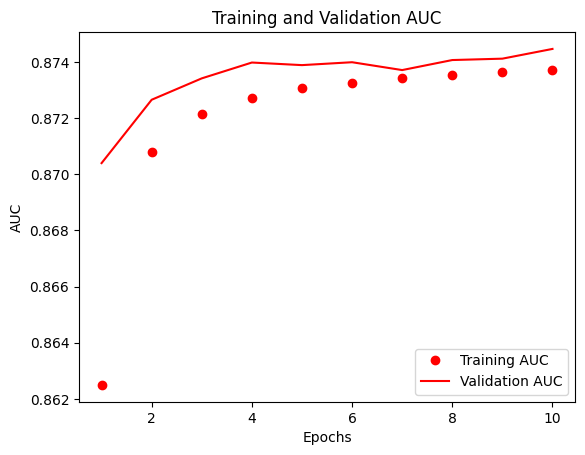

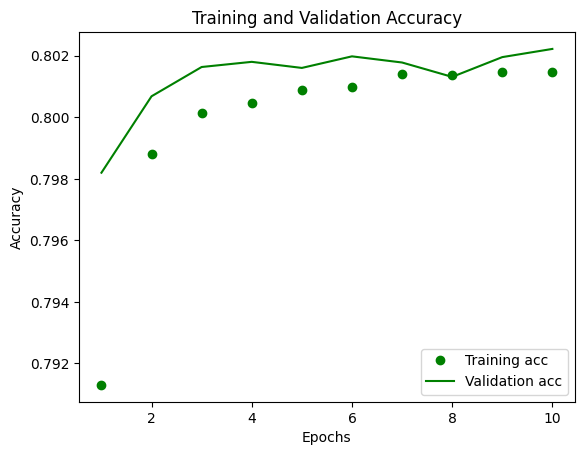

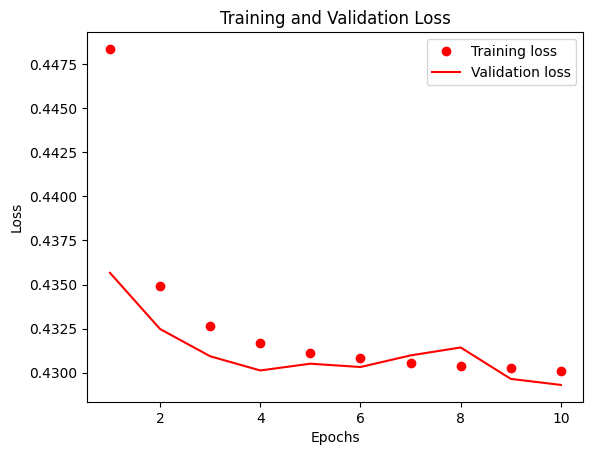

In [28]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc = history_dict['accuracy']
val_acc = history_dict['val_accuracy']
auc = history_dict['auc_3'] # as different models the compiled the name changes : auc_1, auc_2, etc. 
val_auc = history_dict['val_auc_3']
epochs = range(1, len(loss_values) + 1)

plot_auc(auc,val_auc,epochs)
plot_acc(acc, val_acc,epochs)
plot_loss(loss_values, val_loss_values,epochs)

### 6.3 Train for More Epochs

In [29]:
# increase the number of epochs from 10 to 20
model = models.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(8,)))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy',tf.keras.metrics.AUC()])

history = model.fit(partial_X_train, partial_y_train, epochs = 20, batch_size = 512, validation_data= (X_val, y_val))
results = model.evaluate(X_val,y_val)

Epoch 1/20
6250/6250 [==============================] - 10s 2ms/step - loss: 0.4505 - accuracy: 0.7900 - auc_4: 0.8613 - val_loss: 0.4390 - val_accuracy: 0.7964 - val_auc_4: 0.8696
Epoch 2/20
6250/6250 [==============================] - 9s 1ms/step - loss: 0.4362 - accuracy: 0.7980 - auc_4: 0.8701 - val_loss: 0.4330 - val_accuracy: 0.8000 - val_auc_4: 0.8725
Epoch 3/20
6250/6250 [==============================] - 9s 1ms/step - loss: 0.4334 - accuracy: 0.7997 - auc_4: 0.8718 - val_loss: 0.4314 - val_accuracy: 0.8013 - val_auc_4: 0.8734
Epoch 4/20
6250/6250 [==============================] - 9s 1ms/step - loss: 0.4324 - accuracy: 0.8002 - auc_4: 0.8724 - val_loss: 0.4319 - val_accuracy: 0.8008 - val_auc_4: 0.8732
Epoch 5/20
6250/6250 [==============================] - 9s 1ms/step - loss: 0.4317 - accuracy: 0.8006 - auc_4: 0.8728 - val_loss: 0.4331 - val_accuracy: 0.8005 - val_auc_4: 0.8733
Epoch 6/20
6250/6250 [==============================] - 9s 1ms/step - loss: 0.4313 - accuracy: 0.80

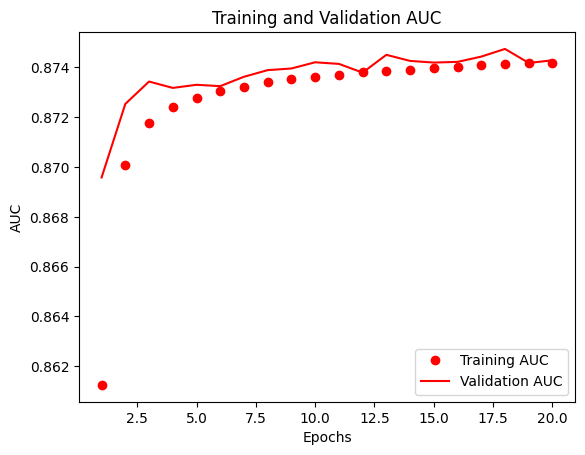

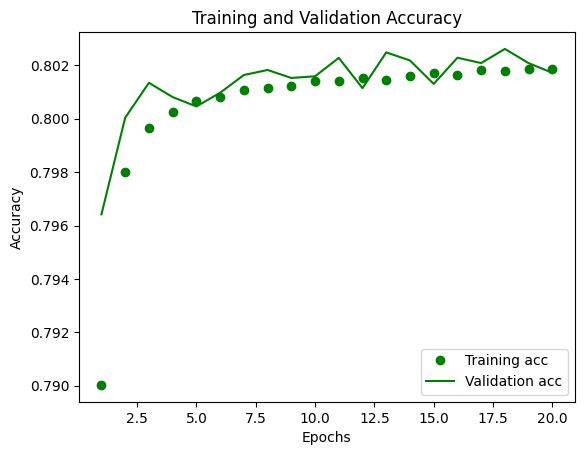

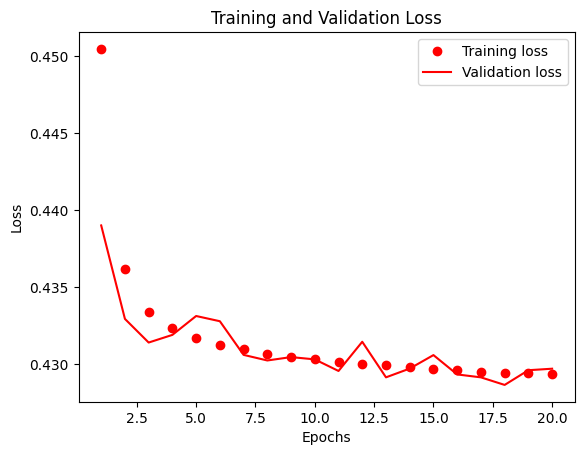

In [30]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc = history_dict['accuracy']
val_acc = history_dict['val_accuracy']
auc = history_dict['auc_4'] # as different models the compiled the name changes : auc_1, auc_2, etc. 
val_auc = history_dict['val_auc_4']
epochs = range(1, len(loss_values) + 1)

plot_auc(auc,val_auc,epochs)
plot_acc(acc, val_acc,epochs)
plot_loss(loss_values, val_loss_values,epochs)

Didn't make much difference to increase the epoch number


## 7. Regularizing the Model & Tuning Hyperparameters

### 7.1 Adding Dropout Layer

In this section we tweak the hyperparameters and different layers. I will stop plotting loss and accuracy for each hyperparameter to save space and only plot the final model.

In [32]:
# Adding Dropout 0.1 - epoch back to 10
model = models.Sequential()
model.add(layers.Dense(512, activation='relu', input_shape=(8,)))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop', 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy',tf.keras.metrics.AUC()])

history = model.fit(partial_X_train, partial_y_train, epochs = 10, batch_size = 512, validation_data= (X_val, y_val))
results = model.evaluate(X_val,y_val)

Epoch 1/10
6250/6250 [==============================] - 140s 22ms/step - loss: 0.4475 - accuracy: 0.7922 - auc_6: 0.8630 - val_loss: 0.4370 - val_accuracy: 0.7997 - val_auc_6: 0.8712
Epoch 2/10
6250/6250 [==============================] - 133s 21ms/step - loss: 0.4365 - accuracy: 0.7984 - auc_6: 0.8698 - val_loss: 0.4329 - val_accuracy: 0.8010 - val_auc_6: 0.8728
Epoch 3/10
6250/6250 [==============================] - 153s 24ms/step - loss: 0.4349 - accuracy: 0.7994 - auc_6: 0.8709 - val_loss: 0.4341 - val_accuracy: 0.8001 - val_auc_6: 0.8725
Epoch 4/10
6250/6250 [==============================] - 146s 23ms/step - loss: 0.4340 - accuracy: 0.7997 - auc_6: 0.8714 - val_loss: 0.4319 - val_accuracy: 0.8011 - val_auc_6: 0.8735
Epoch 5/10
6250/6250 [==============================] - 155s 25ms/step - loss: 0.4335 - accuracy: 0.8002 - auc_6: 0.8717 - val_loss: 0.4311 - val_accuracy: 0.8012 - val_auc_6: 0.8738
Epoch 6/10
6250/6250 [==============================] - 141s 23ms/step - loss: 0.4331